In [65]:
import os
import random
from glob import glob

import matplotlib.pyplot as plt
import numpy as np
#pip install split-folders
#pip install tensorflow
import splitfolders

from IPython.display import display
from PIL import Image
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications.densenet import (DenseNet121,
                                                    preprocess_input)
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.layers import (BatchNormalization, Dense,
                                     Dropout, Flatten, Input)
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [66]:
data_dir = 'dataset'
train_dir = data_dir + '/train'
valid_dir = data_dir + '/valid'
test_dir = data_dir + '/test'


DATASET_PATH = 'dataset'
dir_list = os.listdir(DATASET_PATH)
print(dir_list)

['clean', 'dirty']


In [67]:
num_of_images = []
for root, dirs, files in os.walk(DATASET_PATH):
    if root == DATASET_PATH: continue
    print('{}: {}'.format(os.path.basename(root), len(files)))
    num_of_images.append(len(files))

clean: 228
dirty: 149


path: dataset\clean\IMG_20210707_170812.jpg
size: (2218, 4608)
mode: RGB
format: JPEG


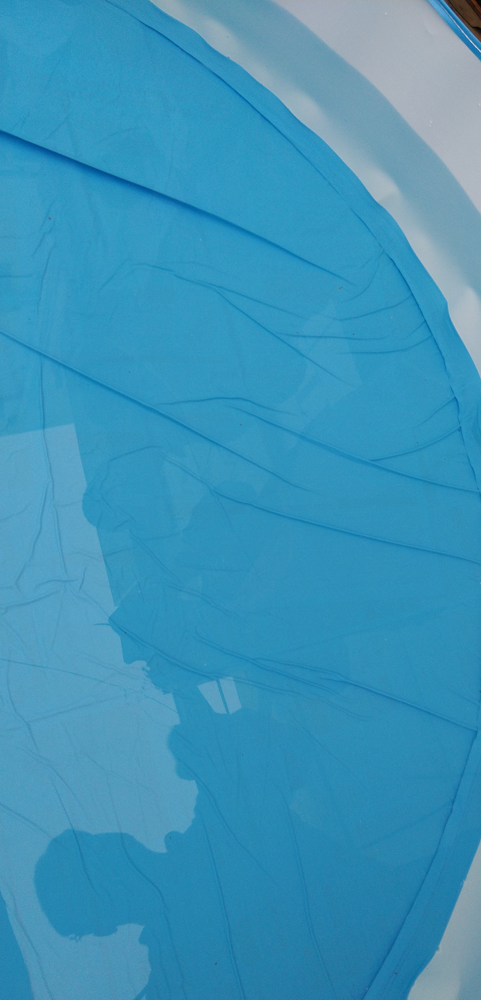

In [68]:
SEED = 123
random.seed(SEED)
rand_img = Image.open(random.choice(glob(DATASET_PATH + '/**/*')))

print('path:', rand_img.filename)
print('size:', rand_img.size)
print('mode:', rand_img.mode)
print('format:', rand_img.format)
display(rand_img)

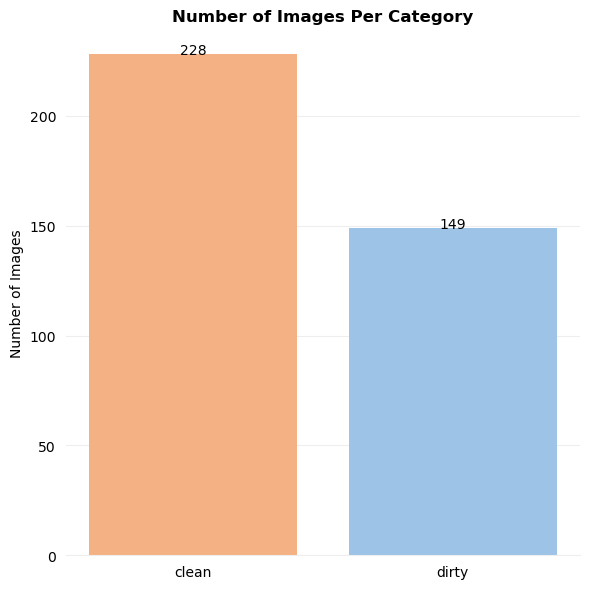

In [69]:
# Plot the number of images per subdirectory
x_coord = np.arange(len(dir_list))
colors = ['#f4b183', '#9dc3e6', '#a9d18e', '#ffd966']

fig, ax = plt.subplots(facecolor='white', figsize=(6,6))
ax.bar(x_coord, num_of_images, color=colors)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#EEEEEE')

ax.yaxis.grid(True, color='#EEEEEE')
ax.set_axisbelow(True)

plt.xticks(x_coord, dir_list)
ax.tick_params(bottom=False, left=False)

plt.title('Number of Images Per Category', fontweight='bold')
plt.ylabel('Number of Images')

for i in range(len(x_coord)):
    plt.text(i, num_of_images[i], num_of_images[i], ha='center')

plt.tight_layout()
plt.savefig('bar_chart.png', dpi=200)
plt.show()

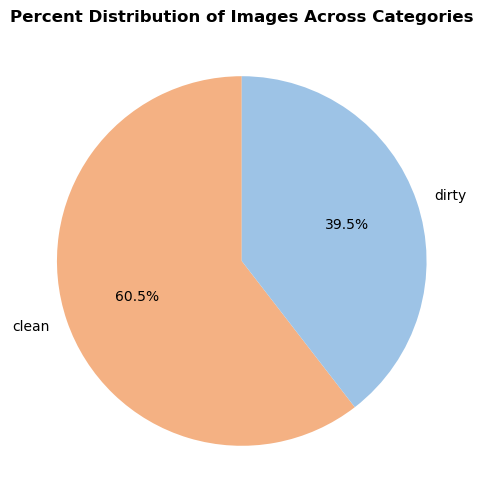

In [70]:
# Plot the percent distribution of images across subdirectories
plt.figure(facecolor='white', figsize=(6,6))
plt.pie(num_of_images,
        labels=dir_list,
        colors=colors,
        autopct='%.1f%%',
        startangle=90)
plt.title('Percent Distribution of Images Across Categories', fontweight='bold')
plt.savefig('pie_chart.png', dpi=200)
plt.show()

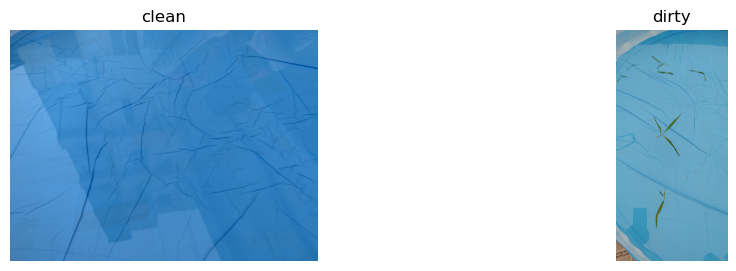

In [71]:
# Display random images, one from each category
plt.figure(facecolor='white', figsize=(12,3))
for i in range(2):
    ax = plt.subplot(1, 2, i + 1)
    path = random.choice(glob(DATASET_PATH + '/' + dir_list[i] + '/*'))
    plt.imshow(Image.open(path), cmap='gray')
    plt.title(dir_list[i])
    plt.axis('off')
plt.savefig('random_images.png', dpi=200)
plt.show()

In [72]:
# Split the dataset folder into test, train, and val folders
OUTPUT_PATH = 'dataset_subsets'
if not os.path.exists(OUTPUT_PATH):
    splitfolders.ratio(DATASET_PATH, OUTPUT_PATH, SEED, (.7, .1, .2))

In [73]:
IMG_DIMS = 100
TARGET_SIZE = (IMG_DIMS, IMG_DIMS)
COLOR_MODE = 'rgb'
CLASS_MODE = 'categorical'
BATCH_SIZE = 16

In [74]:
#data preprocessing
TRAIN_PATH = os.path.join(OUTPUT_PATH, 'train')
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    brightness_range=[0.9, 1.1],
    zoom_range=[0.9, 1.1],
    horizontal_flip=True)
train_gen = train_datagen.flow_from_directory(
    TRAIN_PATH,
    target_size=TARGET_SIZE,
    color_mode=COLOR_MODE,
    class_mode=CLASS_MODE,
    batch_size=BATCH_SIZE,
    seed=SEED)

Found 263 images belonging to 2 classes.


In [75]:
# Take the path to the val folder and generate batches of data
VAL_PATH = os.path.join(OUTPUT_PATH, 'val')
val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input)
val_gen = val_datagen.flow_from_directory(
    VAL_PATH,
    target_size=TARGET_SIZE,
    color_mode=COLOR_MODE,
    class_mode=CLASS_MODE,
    batch_size=BATCH_SIZE,
    seed=SEED)

Found 36 images belonging to 2 classes.


In [76]:
# Take the path to the train folder and generate batches of data
TEST_PATH = os.path.join(OUTPUT_PATH, 'test')
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input)
test_gen = test_datagen.flow_from_directory(
    TEST_PATH,
    target_size=TARGET_SIZE,
    color_mode=COLOR_MODE,
    class_mode=CLASS_MODE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    seed=SEED)

Found 78 images belonging to 2 classes.


In [77]:
print(train_gen.directory)
print(val_gen.directory)
print(test_gen.directory)

dataset_subsets\train
dataset_subsets\val
dataset_subsets\test


In [78]:
print(train_gen.class_indices)

{'clean': 0, 'dirty': 1}


In [79]:
# Print the shapes of the first training batch tuple
images, labels = next(iter(train_gen))
print('images shape:', images.shape)  # (batch_size, *target_size, channels)
print('labels shape:', labels.shape)  # (batch_size, num_classes)

images shape: (16, 100, 100, 3)
labels shape: (16, 2)


In [80]:
# in the input layer it extracts the features and processed
base_model = DenseNet121(
    include_top=False,
    weights='imagenet',
    input_tensor=Input(shape=(IMG_DIMS, IMG_DIMS, 3)),
    input_shape=(IMG_DIMS, IMG_DIMS, 3))

In [81]:
# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

In [82]:
# Build the modified DenseNet121 model
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(BatchNormalization())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.4))
model.add(BatchNormalization())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.4))
model.add(BatchNormalization())
model.add(Dense(256, activation='relu'))
model.add(Dense(2, activation='softmax'))

In [83]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 3, 3, 1024)        7037504   
                                                                 
 flatten_1 (Flatten)         (None, 9216)              0         
                                                                 
 batch_normalization_3 (Bat  (None, 9216)              36864     
 chNormalization)                                                
                                                                 
 dense_4 (Dense)             (None, 1024)              9438208   
                                                                 
 dropout_2 (Dropout)         (None, 1024)              0         
                                                                 
 batch_normalization_4 (Bat  (None, 1024)              4096      
 chNormalization)                                     

In [84]:
# Define hyperparameters
EPOCHS = 2
ETA = 0.0001

In [85]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))


In [86]:
METRICS = ['categorical_accuracy', Precision(), Recall()]

In [87]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['acc',f1_m,precision_m, recall_m])


In [88]:
#METRICS = ['categorical_accuracy', Precision(), Recall()]

In [89]:
# Compile the model
#model.compile(optimizer=Adam(ETA),loss='categorical_crossentropy',metrics=METRICS)

In [90]:
# Create a learning rate scheduler callback
def scheduler(epoch):
    if epoch > 19:
        return ETA * 0.1
    else:
        return ETA
callback = LearningRateScheduler(scheduler)

In [91]:
# Estimate class weights for the unbalanced dataset
cls_wt = compute_class_weight(class_weight='balanced',
                              classes=np.unique(train_gen.labels),
                              y=train_gen.labels)
class_weight = {0: cls_wt[0], 1: cls_wt[1]}
print(class_weight)

{0: 0.8270440251572327, 1: 1.2644230769230769}


In [92]:
# Train the model
history = model.fit(train_gen,
                    epochs=EPOCHS,
                    callbacks=callback,
                    validation_data=val_gen,
                    class_weight=class_weight)

Epoch 1/2
17/17 [==============================] - 169s 9s/step - loss: 0.7289 - acc: 0.6350 - f1_m: 0.6329 - precision_m: 0.6329 - recall_m: 0.6329 - val_loss: 0.2655 - val_acc: 0.9167 - val_f1_m: 0.9375 - val_precision_m: 0.9375 - val_recall_m: 0.9375 - lr: 1.0000e-04
Epoch 2/2
17/17 [==============================] - 108s 6s/step - loss: 0.4024 - acc: 0.7947 - f1_m: 0.8015 - precision_m: 0.8015 - recall_m: 0.8015 - val_loss: 0.1883 - val_acc: 0.9722 - val_f1_m: 0.9167 - val_precision_m: 0.9167 - val_recall_m: 0.9167 - lr: 1.0000e-04


In [93]:
def plot_metric_history(metric, val_metric, y_label, title):
    """
    Plots a training history metric.

    :param metric: the metric key
    :param val_metric: the validation metric key
    :param y_label: the y-axis label
    :param title: the title
    :return: None
    """
    plt.figure(facecolor='white', figsize=(8, 6))
    plt.plot(history.history[metric])
    plt.plot(history.history[val_metric])
    plt.ylabel(y_label)
    plt.xlabel('epoch')
    plt.title(title)
    plt.legend(['training', 'validation'])
    plt.savefig(y_label + '.png', dpi=200)
    plt.show()

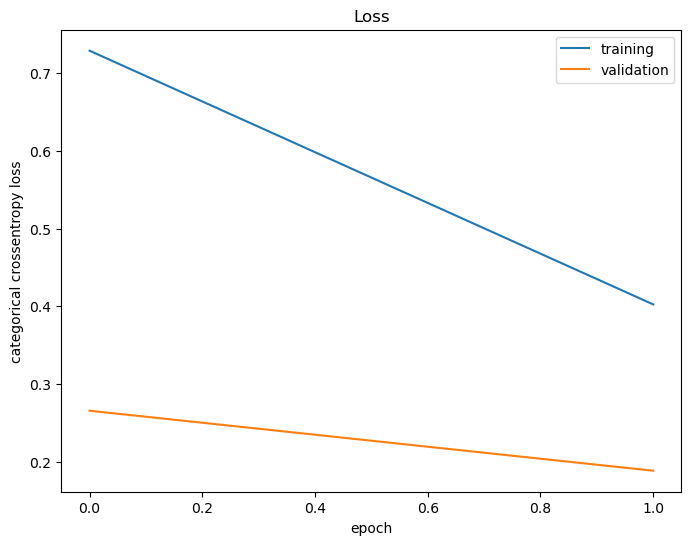

In [94]:
# Visualize loss history
plot_metric_history(metric='loss',
                    val_metric='val_loss',
                    y_label='categorical crossentropy loss',
                    title='Loss')

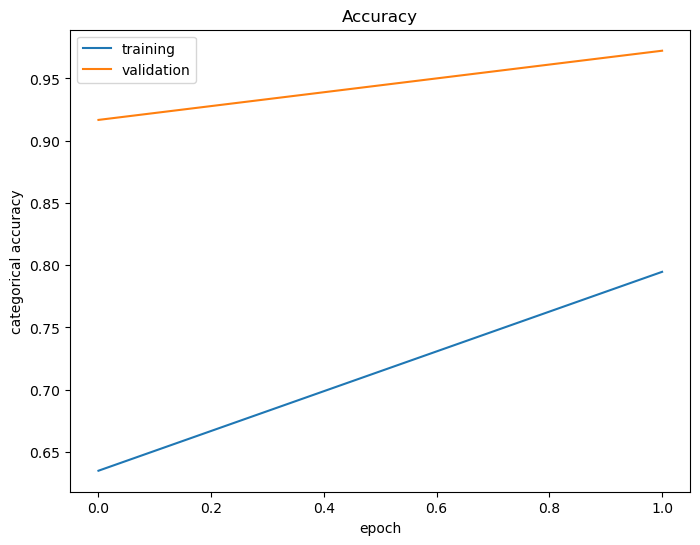

In [95]:
# Visualize accuracy history
plot_metric_history(metric='acc',
                    val_metric='val_acc',
                    y_label='categorical accuracy',
                    title='Accuracy')

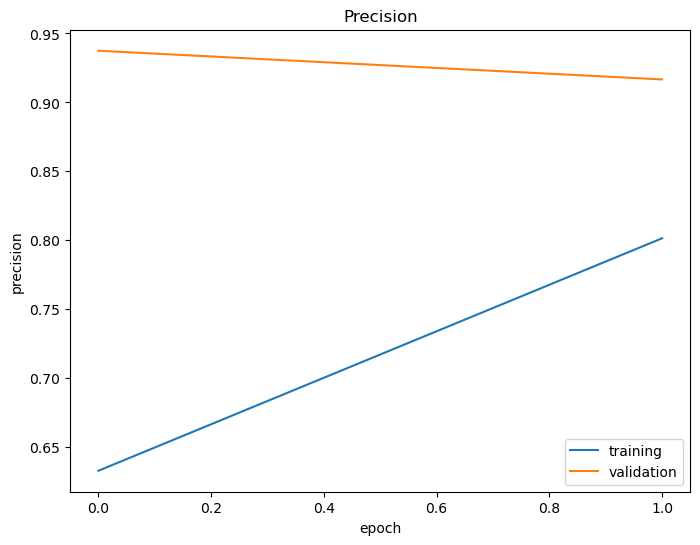

In [96]:
# Visualize precision history
plot_metric_history(metric='precision_m',
                    val_metric='val_precision_m',
                    y_label='precision',
                    title='Precision')

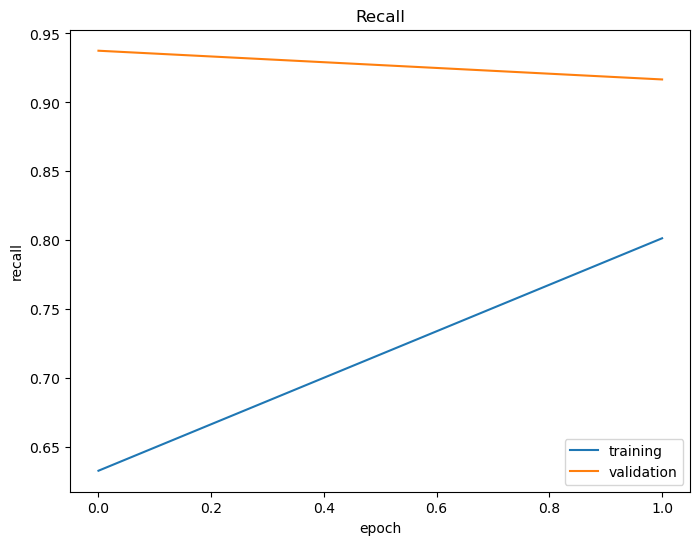

In [97]:
# Visualize recall history
plot_metric_history(metric='recall_m',
                    val_metric='val_recall_m',
                    y_label='recall',
                    title='Recall')

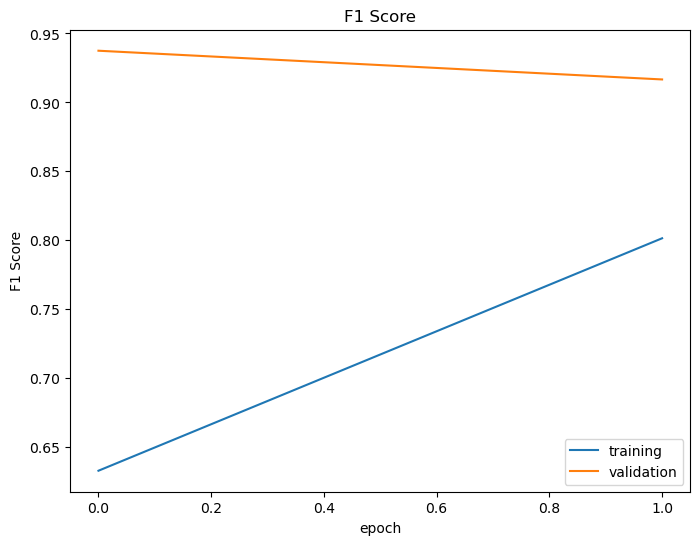

In [98]:
# Visualize recall history
plot_metric_history(metric='f1_m',
                    val_metric='val_f1_m',
                    y_label='F1 Score',
                    title='F1 Score')

In [99]:
# Print metrics values for the model in test mode
result = model.evaluate(test_gen)
dict(zip(model.metrics_names, result))

5/5 [==============================] - 37s 8s/step - loss: 0.3733 - acc: 0.7564 - f1_m: 0.7625 - precision_m: 0.7625 - recall_m: 0.7625


{'loss': 0.37333837151527405,
 'acc': 0.7564102411270142,
 'f1_m': 0.7624999284744263,
 'precision_m': 0.762499988079071,
 'recall_m': 0.762499988079071}

In [100]:
result_train = model.evaluate(train_gen)
dict(zip(model.metrics_names, result_train))

17/17 [==============================] - 93s 5s/step - loss: 0.3850 - acc: 0.7947 - f1_m: 0.7967 - precision_m: 0.7967 - recall_m: 0.7967


{'loss': 0.38500624895095825,
 'acc': 0.7946767807006836,
 'f1_m': 0.7967436909675598,
 'precision_m': 0.7967436909675598,
 'recall_m': 0.7967436909675598}

In [101]:
result_valid = model.evaluate(val_gen)
dict(zip(model.metrics_names, result_valid))

3/3 [==============================] - 11s 3s/step - loss: 0.1883 - acc: 0.9722 - f1_m: 0.9792 - precision_m: 0.9792 - recall_m: 0.9792


{'loss': 0.188290536403656,
 'acc': 0.9722222089767456,
 'f1_m': 0.9791666865348816,
 'precision_m': 0.9791666865348816,
 'recall_m': 0.9791666865348816}

In [102]:
predictions = model.predict(test_gen)

5/5 [==============================] - 30s 5s/step


In [103]:
predictions_train = model.predict(train_gen)

17/17 [==============================] - 86s 5s/step


In [104]:
predictions_val = model.predict(val_gen)

3/3 [==============================] - 12s 4s/step


In [105]:
# Initialize true and predicted label values
y_true = test_gen.labels
y_pred = np.argmax(predictions, axis=1)

In [106]:
# Build a text report showing the main classification metrics
report = classification_report(y_true, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.97      0.62      0.75        47
           1       0.62      0.97      0.76        31

    accuracy                           0.76        78
   macro avg       0.80      0.79      0.76        78
weighted avg       0.83      0.76      0.76        78



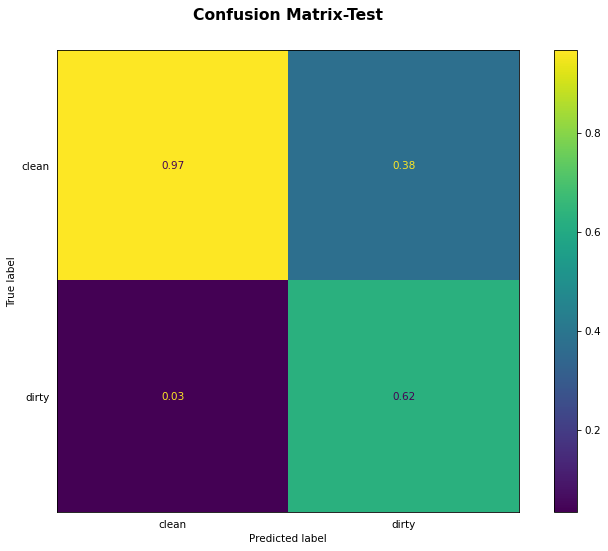

In [107]:
# Plot a confusion matrix given true and predicted labels
fig, ax = plt.subplots(facecolor='white', figsize=(12, 8), dpi=75)
fig = ConfusionMatrixDisplay.from_predictions(y_true,
                                              y_pred,
                                              display_labels=test_gen.class_indices,
                                              include_values=True,
                                              normalize='pred',
                                              values_format='.2f',
                                              cmap='viridis',
                                              ax=ax)
plt.tick_params(left=False, bottom=False)
plt.title('Confusion Matrix-Test', fontsize=15, fontweight='bold', pad=30)
plt.savefig('confusion_matrix_test.png', dpi=200)
plt.show()

In [108]:
# Initialize true and predicted label values train
y_true_train = train_gen.labels
y_pred_train = np.argmax(predictions_train, axis=1)

In [109]:
# Build a text report showing the main classification metrics
report_train = classification_report(y_true_train, y_pred_train)
print(report_train)

              precision    recall  f1-score   support

           0       0.63      0.43      0.51       159
           1       0.41      0.62      0.49       104

    accuracy                           0.50       263
   macro avg       0.52      0.52      0.50       263
weighted avg       0.54      0.50      0.50       263



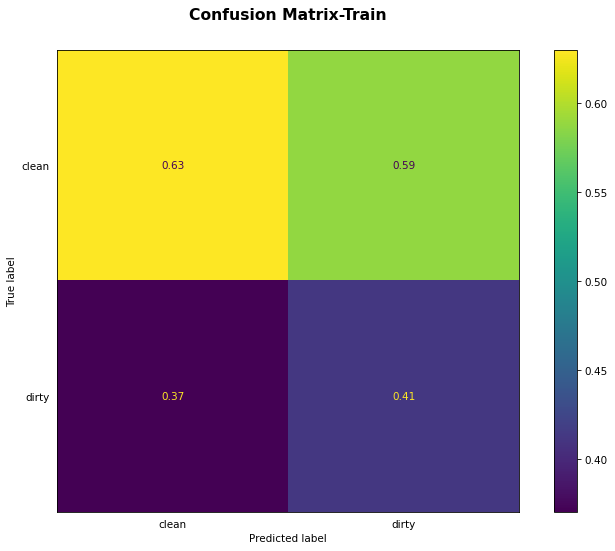

In [110]:
# Plot a confusion matrix given true and predicted labels
fig, ax = plt.subplots(facecolor='white', figsize=(12, 8), dpi=75)
fig = ConfusionMatrixDisplay.from_predictions(y_true_train,
                                              y_pred_train,
                                              display_labels=test_gen.class_indices,
                                              include_values=True,
                                              normalize='pred',
                                              values_format='.2f',
                                              cmap='viridis',
                                              ax=ax)
plt.tick_params(left=False, bottom=False)
plt.title('Confusion Matrix-Train', fontsize=15, fontweight='bold', pad=30)
plt.savefig('confusion_matrix_train.png', dpi=200)
plt.show()

In [111]:
# Initialize true and predicted label values train
y_true_val= val_gen.labels
y_pred_val= np.argmax(predictions_val, axis=1)

In [112]:
# Build a text report showing the main classification metrics
report_val = classification_report(y_true_val, y_pred_val)
print(report_val)

              precision    recall  f1-score   support

           0       0.57      0.55      0.56        22
           1       0.33      0.36      0.34        14

    accuracy                           0.47        36
   macro avg       0.45      0.45      0.45        36
weighted avg       0.48      0.47      0.48        36



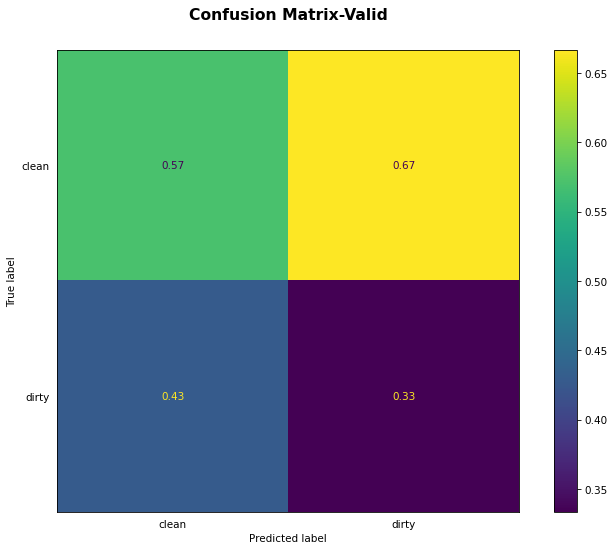

In [113]:
# Plot a confusion matrix given true and predicted labels
fig, ax = plt.subplots(facecolor='white', figsize=(12, 8), dpi=75)
fig = ConfusionMatrixDisplay.from_predictions(y_true_val,
                                              y_pred_val,
                                              display_labels=test_gen.class_indices,
                                              include_values=True,
                                              normalize='pred',
                                              values_format='.2f',
                                              cmap='viridis',
                                              ax=ax)
plt.tick_params(left=False, bottom=False)
plt.title('Confusion Matrix-Valid', fontsize=15, fontweight='bold', pad=30)
plt.savefig('confusion_matrix_valid.png', dpi=200)
plt.show()

In [114]:
model.save_weights("densenet121_1.h5")

In [115]:
filepath="densenet121_1.hdf5"
model.save(filepath)

C:\Users\RAVEESH\anaconda3\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [116]:
def predict(image_path):
    from skimage import io
    from keras.preprocessing import image
    #path='imbalanced/Scratch/Scratch_400.jpg'
    import tensorflow as tf

    img = tf.keras.utils.load_img(image_path, grayscale=False, target_size=(100, 100))
    show_img=tf.keras.utils.load_img(image_path, grayscale=False, target_size=(100, 100))
    disease_class = ['clean', 'dirty']
    
    x = tf.keras.utils.img_to_array(img)
    x = np.expand_dims(x, axis = 0)
    #x = np.array(x, 'float32')
    x /= 255

    custom = model.predict(x)
    print(custom[0])



    #x = x.reshape([64, 64]);

    #plt.gray()
    plt.imshow(show_img)
    plt.show()

    a=custom[0]
    ind=np.argmax(a)

    print('Prediction:',disease_class[ind])
    return disease_class[ind]


1/1 [==============================] - 5s 5s/step
[0.37804917 0.62195086]


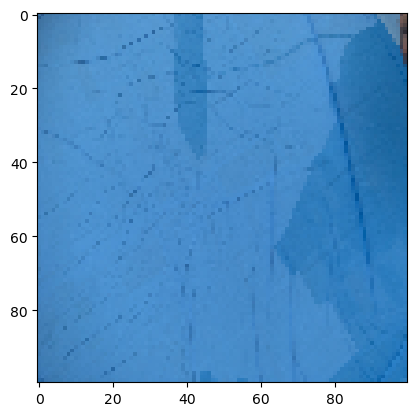

Prediction: dirty


'dirty'

In [117]:
predict('IMG_8162.JPG')

1/1 [==============================] - 0s 130ms/step
[0.41925305 0.58074695]


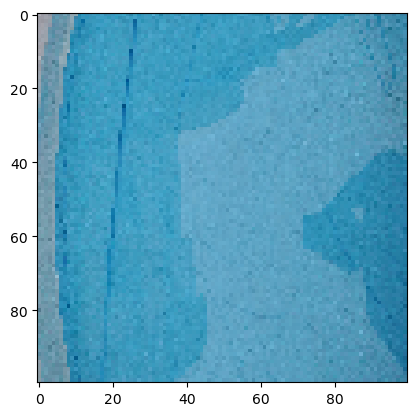

Prediction: dirty


'dirty'

In [118]:
predict('IMG_20210707_170825.JPG')

1/1 [==============================] - 0s 127ms/step
[0.0038129  0.99618715]


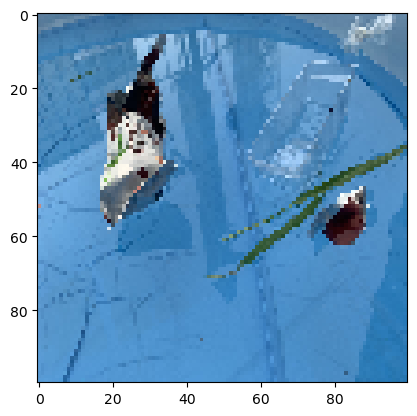

Prediction: dirty


'dirty'

In [119]:
predict('IMG_8043.JPG')

1/1 [==============================] - 0s 138ms/step
[0.08020808 0.91979194]


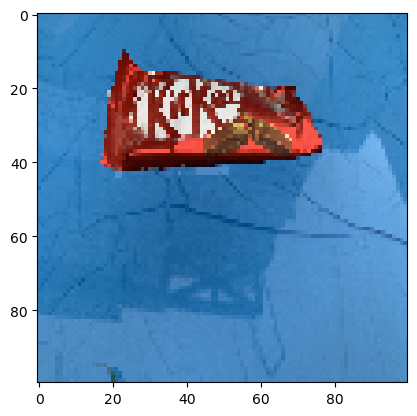

Prediction: dirty


'dirty'

In [120]:
predict('IMG_2736.JPG')

In [141]:
import requests
import shutil
import time

In [142]:
def download():
    url = 'http://192.168.4.3/capture'
    file_name = '1.png'

    res = requests.get(url, stream = True)

    if res.status_code == 200:
        with open(file_name,'wb') as f:
            shutil.copyfileobj(res.raw, f)
        print('Image sucessfully Downloaded: ',file_name)
    else:
        print('Image Couldn\'t be retrieved')

In [143]:

while True:
    download()
    res=predict('1.png')
    #res=prediction()
    print(res)
    if res=="dirty":
        print('garbage')
        requests.get("http://192.168.4.1/f")
        requests.get("http://192.168.4.1/c")
        time.sleep(3)
        requests.get("http://192.168.4.1/b")
        requests.get("http://192.168.4.1/d")
        time.sleep(3)
        requests.get("http://192.168.4.1/s")
        
    else:
        print('no garbage')
        requests.get("http://192.168.4.1/l")
        time.sleep(2)
        requests.get("http://192.168.4.1/s")
    time.sleep(2)

ConnectTimeout: HTTPConnectionPool(host='192.168.4.3', port=80): Max retries exceeded with url: /capture (Caused by ConnectTimeoutError(<urllib3.connection.HTTPConnection object at 0x000001E7820A2210>, 'Connection to 192.168.4.3 timed out. (connect timeout=None)'))